<a href="https://colab.research.google.com/github/FlorianZein/mvsr_lab/blob/main/Detectron2_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install detectron2

In [1]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 4.1 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15681, done.
remote: Counting objects: 100% (404/404), done.
remote: Compressing objects: 100% (315/315), done.
remote: Total 15681 (delta 180), reused 268 (delta 89), pack-reused 15277
Receiving objects: 100% (15681/15681), 6.51 MiB | 1.41 MiB/s, done.
Resolving deltas: 100% (11296/11296), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.7 MB/s eta 0:00:

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.3 ; cuda:  cu121
detectron2: 0.6


In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on a custom dataset

In [4]:
# download, decompress the data
!wget https://github.com/FlorianZein/mvsr_lab/raw/main/correct_mvsrlab.v4-dataset-version3.coco.zip
!ls
!unzip correct_mvsrlab.v4-dataset-version3.coco.zip > /dev/null

--2024-05-29 07:18:59--  https://github.com/FlorianZein/mvsr_lab/raw/main/correct_mvsrlab.v4-dataset-version3.coco.zip
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/FlorianZein/mvsr_lab/main/correct_mvsrlab.v4-dataset-version3.coco.zip [following]
--2024-05-29 07:19:00--  https://raw.githubusercontent.com/FlorianZein/mvsr_lab/main/correct_mvsrlab.v4-dataset-version3.coco.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5638293 (5.4M) [application/zip]
Saving to: ‘correct_mvsrlab.v4-dataset-version3.coco.zip’

correct_mvsrlab.v4- 100%[===================>]   5.38M  --.-KB/s    in 0.02s  

In [6]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("waldo_train", {}, "./mvsrlab.v4-dataset-version3.coco/train/_annotations.coco.json", "./mvsrlab.v4-dataset-version3.coco/train")
register_coco_instances("waldo_val", {}, "./mvsrlab.v4-dataset-version3.coco/valid/_annotations.coco.json", "./mvsrlab.v4-dataset-version3.coco/valid")
register_coco_instances("waldo_test", {}, "./mvsrlab.v4-dataset-version3.coco/test/_annotations.coco.json", "./mvsrlab.v4-dataset-version3.coco/test")

Verifying train data...

WARNING [05/29 07:20:39 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/29 07:20:39 d2.data.datasets.coco]: Loaded 20 images in COCO format from ./mvsrlab.v4-dataset-version3.coco/train/_annotations.coco.json


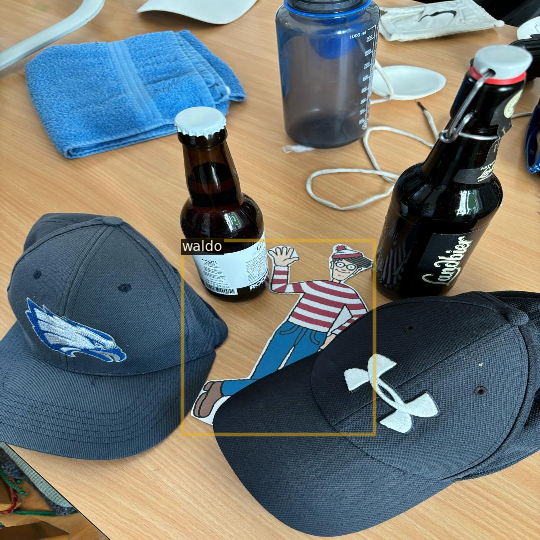

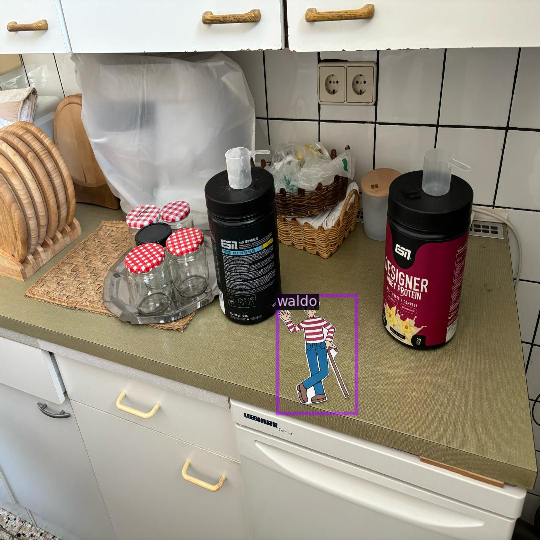

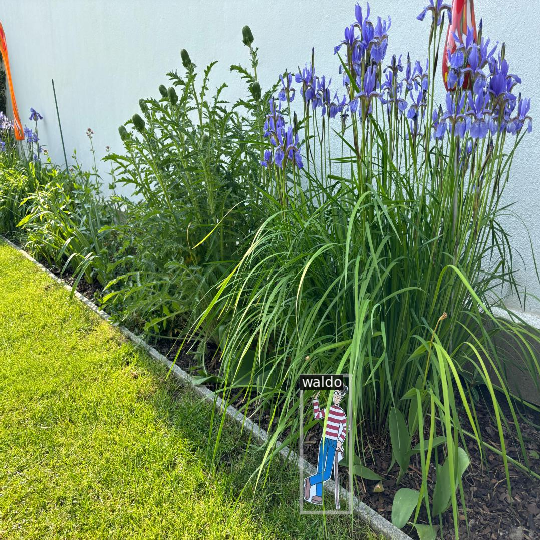

In [10]:
from detectron2.data.datasets import register_coco_instances
dataset_dicts = DatasetCatalog.get("waldo_train")
waldo_metadata = MetadataCatalog.get("waldo_train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=waldo_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

Training...

In [11]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("waldo_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/29 07:21:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:00, 201MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[05/29 07:21:11 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/29 07:21:23 d2.utils.events]:  eta: 0:01:22  iter: 19  total_loss: 1.078  loss_cls: 0.6713  loss_box_reg: 0.3802  loss_rpn_cls: 0.01645  loss_rpn_loc: 0.004688    time: 0.2944  last_time: 0.3126  data_time: 0.0224  last_data_time: 0.0159   lr: 1.6068e-05  max_mem: 1736M
[05/29 07:21:33 d2.utils.events]:  eta: 0:01:17  iter: 39  total_loss: 0.9656  loss_cls: 0.5392  loss_box_reg: 0.4023  loss_rpn_cls: 0.01835  loss_rpn_loc: 0.004531    time: 0.3059  last_time: 0.3250  data_time: 0.0107  last_data_time: 0.0086   lr: 3.2718e-05  max_mem: 1737M
[05/29 07:21:39 d2.utils.events]:  eta: 0:01:11  iter: 59  total_loss: 0.8489  loss_cls: 0.4013  loss_box_reg: 0.4209  loss_rpn_cls: 0.01664  loss_rpn_loc: 0.004099    time: 0.3088  last_time: 0.2784  data_time: 0.0121  last_data_time: 0.0059   lr: 4.9367e-05  max_mem: 1739M
[05/29 07:21:46 d2.utils.events]:  eta: 0:01:09  iter: 79  total_loss: 0.7586  loss_cls: 0.3311  loss_box_reg: 0.4176  loss_rpn_cls: 0.01733  loss_rpn_loc: 0.00433    time: 

In [12]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model




In [13]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[05/29 07:23:22 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


Then, we randomly select several samples to visualize the prediction results.

In [14]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("waldo_train", cfg, False, output_dir="./outputTrain/")
val_loader = build_detection_test_loader(cfg, "waldo_train")

trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
inference_on_dataset(trainer.model, val_loader, evaluator)

[05/29 07:23:24 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [05/29 07:23:24 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [05/29 07:23:24 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/29 07:23:24 d2.data.datasets.coco]: Loaded 20 images in COCO format from ./mvsrlab.v4-dataset-version3.coco/train/_annotations.coco.json
[05/29 07:23:24 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/29 07:23:24 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/29 07:23:24 d2.data.common]: Serializing 20 elements to byte tensors and concatenating them all ...
[05/29 07:23:24 d2.data.common]: Seri

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/29 07:23:27 d2.evaluation.evaluator]: Inference done 11/20. Dataloading: 0.0089 s/iter. Inference: 0.1011 s/iter. Eval: 0.0004 s/iter. Total: 0.1103 s/iter. ETA=0:00:00


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/29 07:23:28 d2.evaluation.evaluator]: Total inference time: 0:00:01.646904 (0.109794 s / iter per device, on 1 devices)
[05/29 07:23:28 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.095561 s / iter per device, on 1 devices)
[05/29 07:23:28 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/29 07:23:28 d2.evaluation.coco_evaluation]: Saving results to ./outputTrain/coco_instances_results.json
[05/29 07:23:28 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.735
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.941
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.941
 Av

OrderedDict([('bbox',
              {'AP': 73.45032134792426,
               'AP50': 94.05940594059405,
               'AP75': 94.05940594059405,
               'APs': nan,
               'APm': nan,
               'APl': 73.45032134792426})])

In [15]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("waldo_val", cfg, False, output_dir="./outputValid/")
val_loader = build_detection_test_loader(cfg, "waldo_val")

trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
inference_on_dataset(trainer.model, val_loader, evaluator)


[05/29 07:23:39 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [05/29 07:23:39 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [05/29 07:23:39 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/29 07:23:39 d2.data.datasets.coco]: Loaded 3 images in COCO format from ./mvsrlab.v4-dataset-version3.coco/valid/_annotations.coco.json
[05/29 07:23:39 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   waldo    | 3            |
|            |              |
[05/29 07:23:39 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/29 07:23:39 d2.data.common]: Serializing the dataset u

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/29 07:23:41 d2.evaluation.evaluator]: Total inference time: 0:00:00.166800 (0.166800 s / iter per device, on 1 devices)
[05/29 07:23:41 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.076326 s / iter per device, on 1 devices)
[05/29 07:23:41 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/29 07:23:41 d2.evaluation.coco_evaluation]: Saving results to ./outputValid/coco_instances_results.json
[05/29 07:23:41 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.00s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.256
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.299
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.299
 Av

OrderedDict([('bbox',
              {'AP': 25.603960396039604,
               'AP50': 29.900990099009896,
               'AP75': 29.900990099009896,
               'APs': nan,
               'APm': nan,
               'APl': 25.603960396039604})])

In [20]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("waldo_test", cfg, False, output_dir="./outputTest/")
val_loader = build_detection_test_loader(cfg, "waldo_test")

trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
inference_on_dataset(trainer.model, val_loader, evaluator)

[05/29 07:26:17 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [05/29 07:26:17 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [05/29 07:26:17 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/29 07:26:17 d2.data.datasets.coco]: Loaded 2 images in COCO format from ./mvsrlab.v4-dataset-version3.coco/test/_annotations.coco.json
[05/29 07:26:17 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   waldo    | 2            |
|            |              |
[05/29 07:26:17 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/29 07:26:17 d2.data.common]: Serializing the dataset us

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/29 07:26:19 d2.evaluation.evaluator]: Total inference time: 0:00:00.191015 (0.191015 s / iter per device, on 1 devices)
[05/29 07:26:19 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.098955 s / iter per device, on 1 devices)
[05/29 07:26:19 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/29 07:26:19 d2.evaluation.coco_evaluation]: Saving results to ./outputTest/coco_instances_results.json
[05/29 07:26:19 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.00s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.202
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.252
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.252
 Ave

OrderedDict([('bbox',
              {'AP': 20.198019801980198,
               'AP50': 25.247524752475247,
               'AP75': 25.247524752475247,
               'APs': nan,
               'APm': nan,
               'APl': 20.198019801980198})])

WARNING [05/29 07:35:31 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/29 07:35:31 d2.data.datasets.coco]: Loaded 3 images in COCO format from ./mvsrlab.v4-dataset-version3.coco/valid/_annotations.coco.json


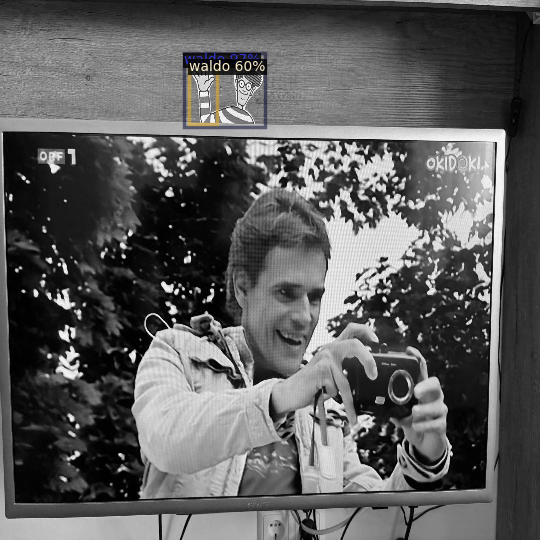

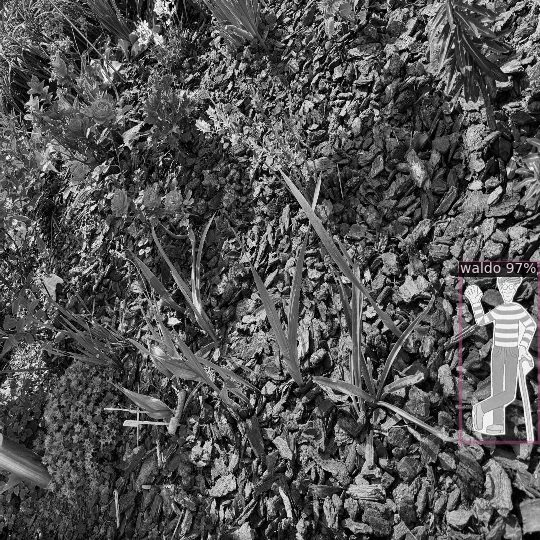

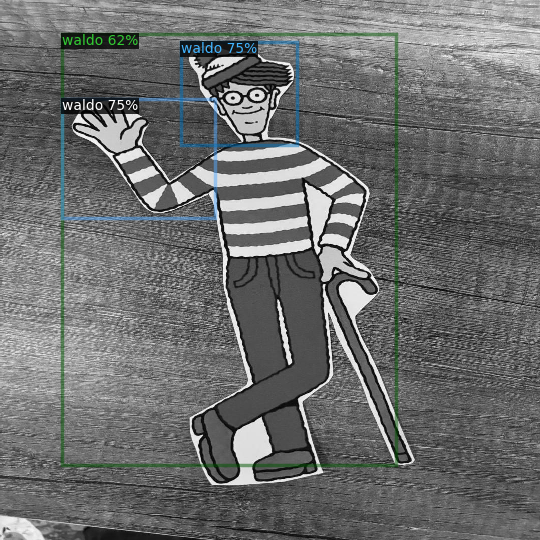

In [29]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("waldo_val")
for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=waldo_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])